In [2]:
if __name__ == '__main__':
    import sys
    import os
    from pathlib import Path
    curr_file_path = Path(os.path.abspath(''))
    sys.path.append(str(curr_file_path.parent))

import numpy as np
import glob2 as glob
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from sklearn.decomposition import PCA
import pickle
from sklearn.linear_model import LinearRegression
from aux_funcs import colored_line, compressed_read, logical_and
from itertools import permutations


plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 2.0

In [3]:
def load_numpy(data_path, averaging_size=1):
    file_names = glob.glob(data_path)
    data = []
    for file_name in file_names:
        data_for_file = np.load(file_name)
        data.append(data_for_file)
    data = np.concatenate(data, axis=1)
    if averaging_size == 1:
        return data
    reduced_data = np.empty((data.shape[0], int(data.shape[1] / averaging_size)))
    for k in range(0, int(data.shape[1] / averaging_size) * averaging_size, averaging_size):
        reduced_data[:, int(k / averaging_size)] = data[:, k:k + averaging_size].mean(axis=1)
    return reduced_data

def load_data(data_path, indices=[]):
#     file_names = glob.glob(data_path)
    file_names = sorted(os.listdir(data_path))
    print(file_names)
    for fidx, file_name in enumerate(file_names):
        if fidx in indices or (len(indices) == 0 and fidx + 1 == len(file_names)):
            data_for_file = pickle.load(open(os.path.join(data_path, file_name), 'rb'))
            yield data_for_file

def load_compressed_data(data_path, indices=[], all=False):
    file_names = sorted(os.listdir(data_path))
    print(file_names)
    for fidx, file_name in enumerate(file_names):
        if fidx in indices or (len(indices) == 0 and fidx + 1 == len(file_names)) or all:
            data_for_file = compressed_read(os.path.join(data_path, file_name))
            yield data_for_file

def load_behavioral_data(data_path, update_num=None, all=False):
    indices = [] if update_num is None else [update_num]
    state_data = load_compressed_data(
        data_path,
        indices=indices,
        all=all,
    )

    return state_data

def parse_session(data_path, env_idx):
    state_data = load_behavioral_data(
        data_path,
        update_num=int(env_idx / 30)
    )

    env_idx = env_idx % 30
    
    d = state_data.__next__()

    features = [
        'current_patch_num',
        'reward_site_idx',
        'current_reward_site_attempted',
        'agent_in_patch',
        'patch_reward_param',
        'action',
        'reward',
    ]

    features_to_time_series_dict = {}
    for f in features:
        features_to_time_series_dict[f] = np.zeros((len(d)))
    
    for k in np.arange(len(d)):
        for f in features:
            features_to_time_series_dict[f][k] = d[k][f][env_idx]

    features_to_time_series_dict['current_patch_num'] = features_to_time_series_dict['current_patch_num'].astype(int)
    features_to_time_series_dict['reward_site_idx'] = features_to_time_series_dict['reward_site_idx'].astype(int)
    features_to_time_series_dict['reward_params_for_patches'] = np.empty((3,))

    dwell_time = np.zeros((len(d)))
    rewards_seen_in_patch = np.zeros((len(d)))
    num_patch_types = len(np.unique(features_to_time_series_dict['current_patch_num']))
    rewards_seen_in_patch_type = np.zeros((len(d), num_patch_types))
    total_stops_in_patch_type = np.zeros((len(d), num_patch_types))
    n_rewards_at_reward_site_idx_for_patch_type = np.zeros((len(d), 10, num_patch_types))
    attempts_at_reward_site_idx_for_patch_type = np.zeros((len(d), 10, num_patch_types))
    
    for idx in np.arange(0, len(d)):
        curr_patch_type = features_to_time_series_dict['current_patch_num'][idx]
        
        if idx > 0 and features_to_time_series_dict['action'][idx] == 0:
            dwell_time[idx] = dwell_time[idx-1] + 1
        else:
            dwell_time[idx] = 0

        if features_to_time_series_dict['agent_in_patch'][idx]:
            if idx > 0:
                rewards_seen_in_patch[idx] = rewards_seen_in_patch[idx-1] + features_to_time_series_dict['reward'][idx]
            else:
                rewards_seen_in_patch[idx] = features_to_time_series_dict['reward'][idx]

        if features_to_time_series_dict['reward_site_idx'][idx] >= 0:
            features_to_time_series_dict['reward_params_for_patches'][curr_patch_type] = features_to_time_series_dict['patch_reward_param'][idx]

        if idx > 0:
            reward = features_to_time_series_dict['reward'][idx]
            rewards_seen_in_patch_type[idx, :] = rewards_seen_in_patch_type[idx-1, :]
            rewards_seen_in_patch_type[idx, curr_patch_type] += reward
            total_stops_in_patch_type[idx, :] = total_stops_in_patch_type[idx-1, :]
            n_rewards_at_reward_site_idx_for_patch_type[idx, ...] = n_rewards_at_reward_site_idx_for_patch_type[idx-1, ...]
            attempts_at_reward_site_idx_for_patch_type[idx, ...] = attempts_at_reward_site_idx_for_patch_type[idx-1, ...]

            rsi = features_to_time_series_dict['reward_site_idx'][idx]
            if features_to_time_series_dict['current_reward_site_attempted'][idx] and not features_to_time_series_dict['current_reward_site_attempted'][idx-1]:
                total_stops_in_patch_type[idx, curr_patch_type] += 1
                if rsi < 10:
                    attempts_at_reward_site_idx_for_patch_type[idx, rsi, curr_patch_type] += 1
                    if features_to_time_series_dict['reward'][idx-1]:
                        n_rewards_at_reward_site_idx_for_patch_type[idx, rsi, curr_patch_type] += 1
                    
                

    features_to_time_series_dict['dwell_time'] = dwell_time
    features_to_time_series_dict['rewards_seen_in_patch'] = rewards_seen_in_patch
    features_to_time_series_dict['rewards_seen_in_patch_type'] = rewards_seen_in_patch_type
    features_to_time_series_dict['total_stops_in_patch_type'] = total_stops_in_patch_type
    features_to_time_series_dict['n_rewards_at_reward_site_idx_for_patch_type'] = n_rewards_at_reward_site_idx_for_patch_type
    features_to_time_series_dict['attempts_at_reward_site_idx_for_patch_type'] = attempts_at_reward_site_idx_for_patch_type
    
    return features_to_time_series_dict

In [10]:
def create_colormap(colors, name):
    """
    Create a custom colormap.

    Parameters:
        colors (list): A list of colors as strings or RGB tuples.
        name (str): Name of the colormap.

    Returns:
        LinearSegmentedColormap: The custom colormap.
    """
    return LinearSegmentedColormap.from_list(name, colors)

def plot_colormap(colormap, title):
    """
    Plot a colormap for visualization.

    Parameters:
        colormap (LinearSegmentedColormap): The colormap to visualize.
        title (str): Title of the plot.
    """
    gradient = np.linspace(0, 1, 256).reshape(1, -1)
    plt.figure(figsize=(8, 1))
    plt.imshow(gradient, aspect='auto', cmap=colormap)
    plt.axis('off')
    plt.title(title, loc='center', pad=10)
    plt.show()

# Define colors for each colormap
red_colors = [(1, 0.6, 0.6), (0.4, 0, 0)]  # Dark red to light red
blue_colors = [(0.6, 0.6, 1), (0, 0, 0.4)]  # Dark blue to light blue
purple_colors = [(0.8, 0.2, 0.8), (0.2, 0, 0.2)]  # Dark purple to bright purple
green_colors = [(0.6, 1, 0.6), (0, 0.4, 0)]  # Light green to dark green
orange_colors = [(1, 0.8, 0.6), (0.6, 0.3, 0)]  # Light orange to dark orange
brown_colors = [(0.8, 0.5, 0.2), (0.4, 0.2, 0)]  # Light brown to dark brown

# Create the colormaps
red_colormap = create_colormap(red_colors, "RedColormap")
blue_colormap = create_colormap(blue_colors, "BlueColormap")
purple_colormap = create_colormap(purple_colors, "PurpleColormap")
green_colormap = create_colormap(green_colors, "GreegColormap")
orange_colormap = create_colormap(orange_colors, "OrangeColormap")
brown_colormap = create_colormap(brown_colors, "BrownColormap")

In [4]:
env_indices = np.arange(210, 240)

data = load_numpy('../../results/rl_agent_outputs/structural_priors_in_rl_low_noise_optim_01_test_2025-01-08_10_52_23_295387_var_noise_0.0001_activity_weight_1.0/hidden_state/*.npy')
data = np.transpose(data, [2, 1, 0])

print(data.shape)
flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2], order='C')

pca = PCA()
print(flattened_data.shape)
pc_activities = pca.fit_transform(flattened_data.T)
print('s:', pc_activities.T.shape)
pc_activities = pc_activities.T.reshape(data.shape, order='C')

all_session_data = []

for env_idx in env_indices:
    session_data = parse_session(
        '../../results/rl_agent_outputs/structural_priors_in_rl_low_noise_optim_01_test_2025-01-08_10_52_23_295387_var_noise_0.0001_activity_weight_1.0/state',
        env_idx=env_idx,
    )
    all_session_data.append(session_data)

explained_variance_ratios = pca.explained_variance_ratio_


(128, 240, 20000)
(128, 4800000)
s: (128, 4800000)
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
['00

(128, 240, 20000)


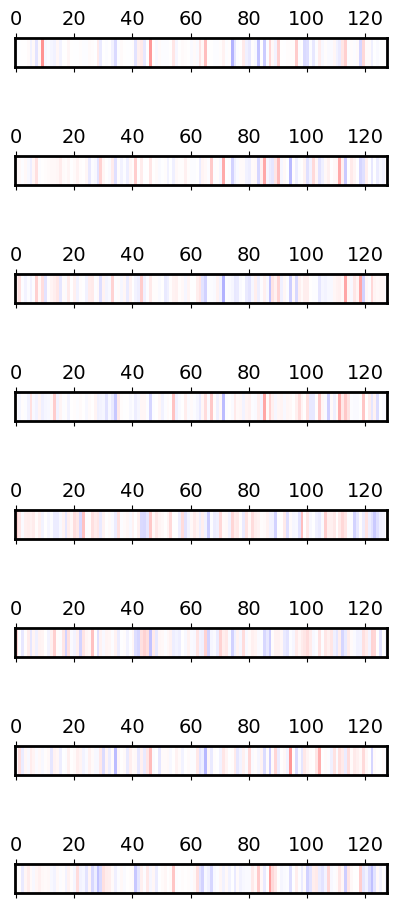

In [7]:
print(pc_activities.shape)
explained_variance_ratios = pca.explained_variance_ratio_
pca.components_

scale = 0.8
fig, axs = plt.subplots(8, 1, figsize=(6 * scale, 15 * scale))

for i in range(8):
    axs[i].matshow(pca.components_[i, :, np.newaxis].T, aspect=10, cmap='bwr', vmin=-1, vmax=1)
    axs[i].set_yticks([])



239
(128, 240, 20000)


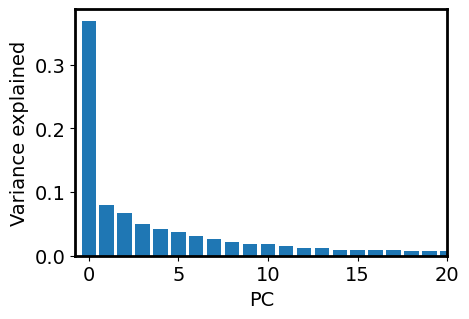

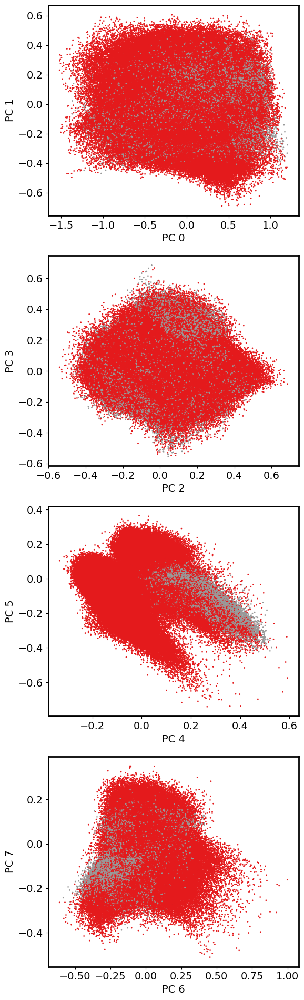

In [5]:
print(env_idx)

scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 20)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))

print(pc_activities.shape)

for k in np.arange(0, 8, 2):
    for env_idx in env_indices:
        cbar = axs[int(k/2)].scatter(
            pc_activities[k, env_idx, :],
            pc_activities[k+1, env_idx, :],
            s=1,
            c=all_session_data[env_idx - env_indices[0]]['agent_in_patch'],
            cmap='Set1_r',
            # vmax=2,
        )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    # fig.colorbar(cbar)
fig.tight_layout()

[10.]
[10.]
[10.]
[10.]
[10.]
[10.]


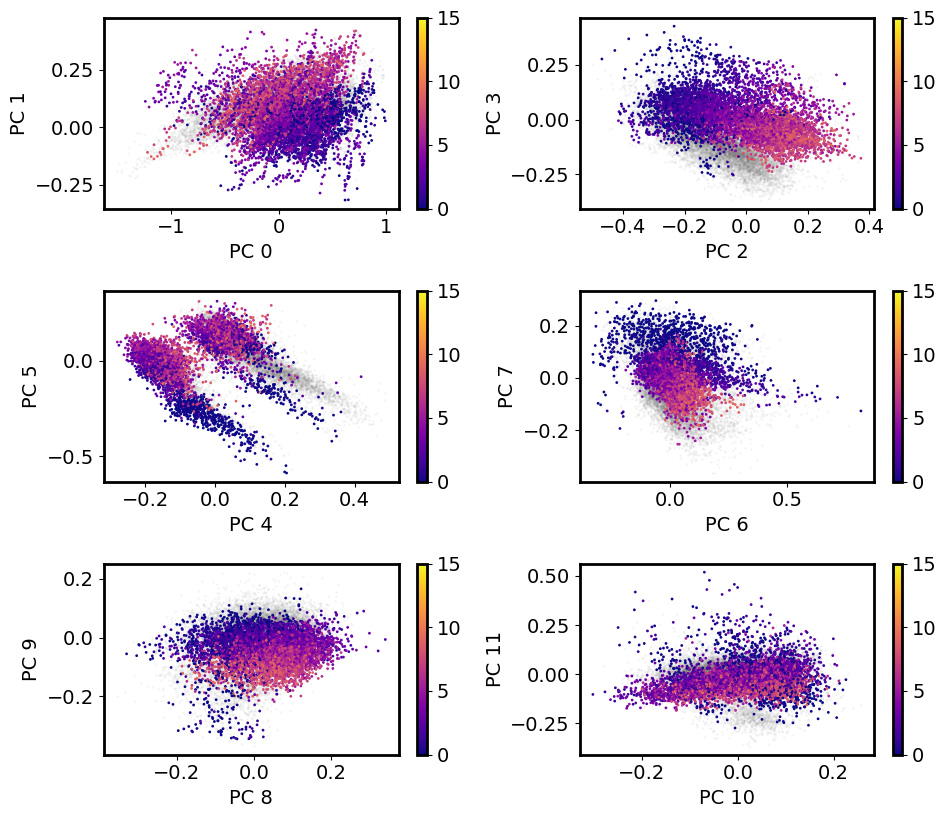

In [12]:
scale = 1.4
fig, axs = plt.subplots(3, 2, figsize=(7 * scale, 6 * scale)) # sharex=True, sharey=True)
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]

for k in np.arange(0, 12, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2

    for env_idx in env_indices[12:13]:
        session_data = all_session_data[env_idx - env_indices[0]]
        
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            session_data['reward_site_idx'] >= 0,
            session_data['reward_site_idx'] < 10,
            patch_nums == 0,
        )
        mask_off = ~mask_on

        print(np.unique(session_data['patch_reward_param'][mask_on]))
            
        cbar = axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_on],
            pc_activities[k+1, env_idx, :][mask_on],
            s=1,
            cmap='plasma',
            c=session_data['reward_site_idx'][mask_on],
            vmin=0,
            vmax=15,
        )
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_off],
            pc_activities[k+1, env_idx, :][mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[k_x, k_y].set_xlim(-1.5, 1.5)
    # axs[k_x, k_y].set_ylim(-1.5, 1.5)
    
    # axs[int(k/2)].set_aspect('equal')
# axs[0, 0].set_title('Activity colored by current patch odor')
    fig.colorbar(cbar)
fig.tight_layout()

[30.]
[30.]
[30.]
[30.]
[30.]
[30.]


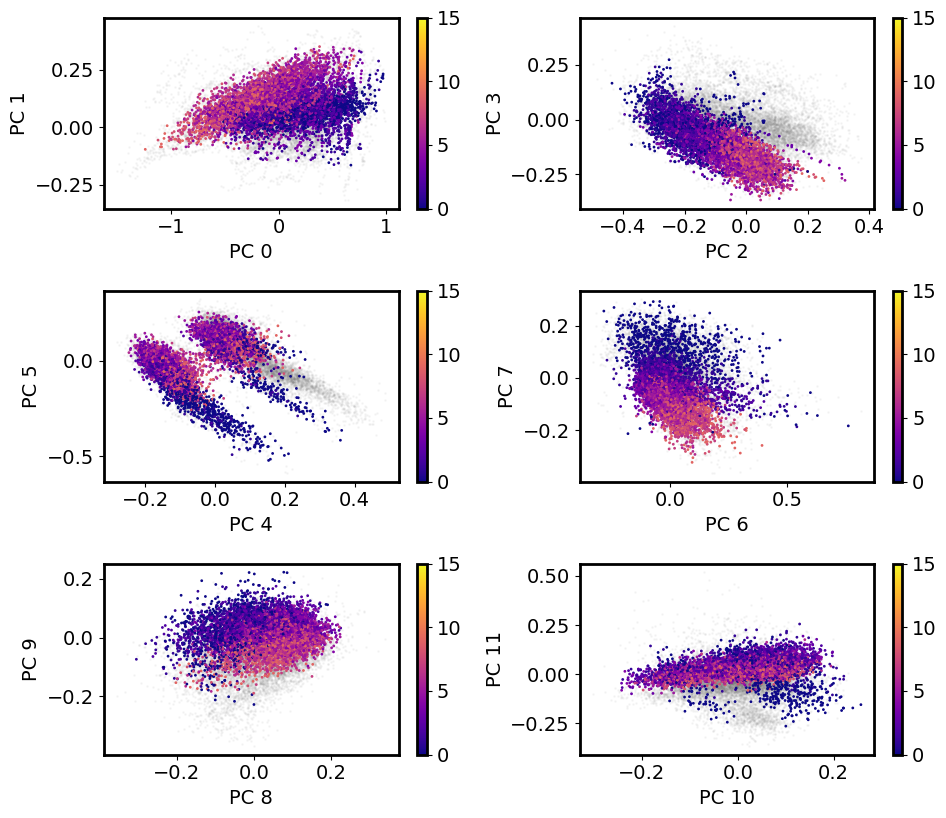

In [18]:
scale = 1.4
fig, axs = plt.subplots(3, 2, figsize=(7 * scale, 6 * scale)) # sharex=True, sharey=True)
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]

for k in np.arange(0, 12, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2

    for env_idx in env_indices[12:13]:
        session_data = all_session_data[env_idx - env_indices[0]]
        
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            session_data['reward_site_idx'] >= 0,
            session_data['reward_site_idx'] < 10,
            patch_nums == 1,
        )
        mask_off = ~mask_on

        print(np.unique(session_data['patch_reward_param'][mask_on]))
            
        cbar = axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_on],
            pc_activities[k+1, env_idx, :][mask_on],
            s=1,
            cmap='plasma',
            c=session_data['reward_site_idx'][mask_on],
            vmin=0,
            vmax=15,
        )
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_off],
            pc_activities[k+1, env_idx, :][mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[k_x, k_y].set_xlim(-1.5, 1.5)
    # axs[k_x, k_y].set_ylim(-1.5, 1.5)
    
    # axs[int(k/2)].set_aspect('equal')
# axs[0, 0].set_title('Activity colored by current patch odor')
    fig.colorbar(cbar)
fig.tight_layout()

[30.]
[30.]
[30.]
[30.]
[30.]
[30.]


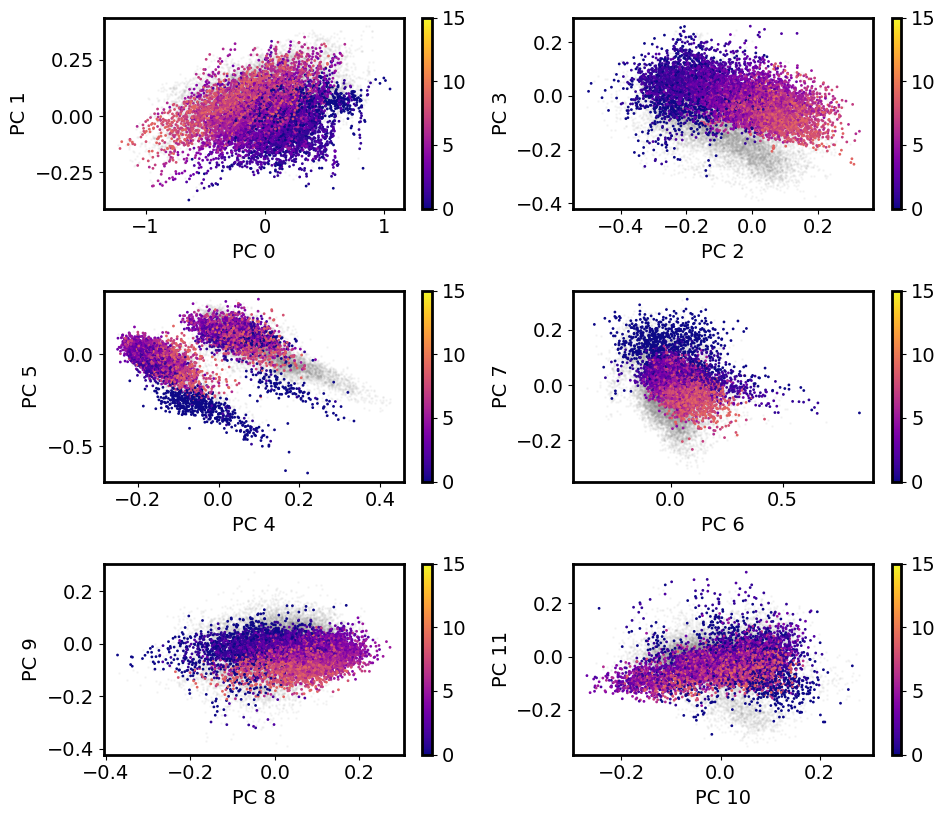

In [14]:
scale = 1.4
fig, axs = plt.subplots(3, 2, figsize=(7 * scale, 6 * scale)) # sharex=True, sharey=True)
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]

for k in np.arange(0, 12, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2

    for env_idx in env_indices[13:14]:
        session_data = all_session_data[env_idx - env_indices[0]]
        
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            session_data['reward_site_idx'] >= 0,
            session_data['reward_site_idx'] < 10,
            patch_nums == 0,
        )
        mask_off = ~mask_on

        print(np.unique(session_data['patch_reward_param'][mask_on]))
            
        cbar = axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_on],
            pc_activities[k+1, env_idx, :][mask_on],
            s=1,
            cmap='plasma',
            c=session_data['reward_site_idx'][mask_on],
            vmin=0,
            vmax=15,
        )
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_off],
            pc_activities[k+1, env_idx, :][mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[k_x, k_y].set_xlim(-1.5, 1.5)
    # axs[k_x, k_y].set_ylim(-1.5, 1.5)
    
    # axs[int(k/2)].set_aspect('equal')
# axs[0, 0].set_title('Activity colored by current patch odor')
    fig.colorbar(cbar)
fig.tight_layout()

[10.]
[10.]
[10.]
[10.]
[10.]
[10.]


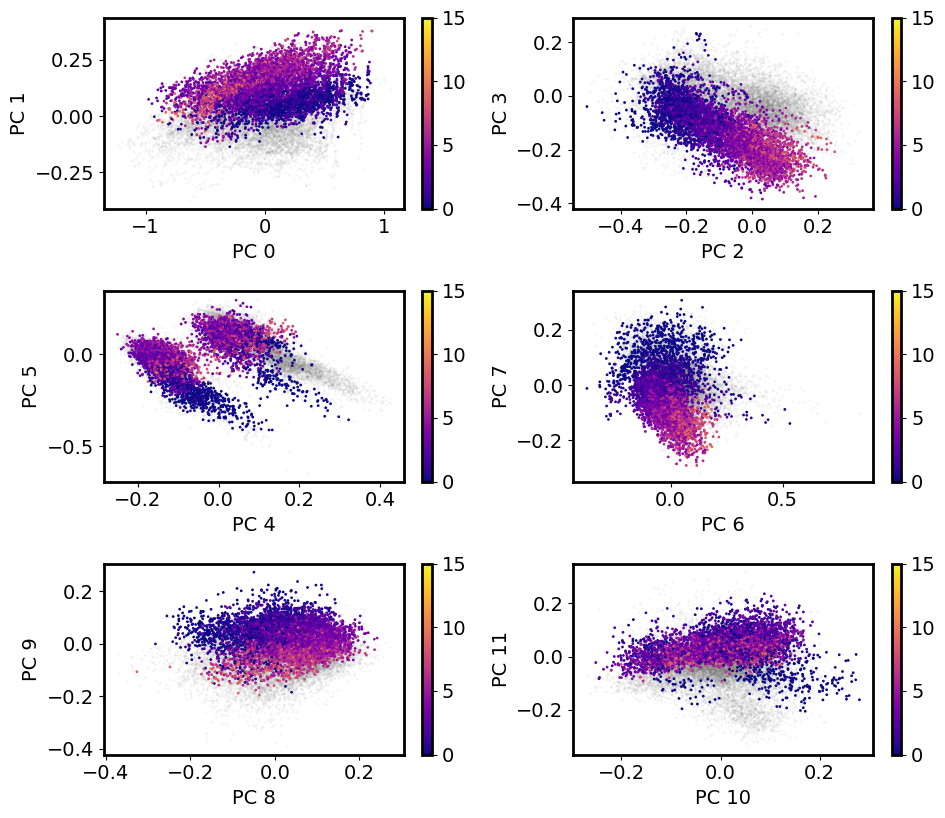

In [15]:
scale = 1.4
fig, axs = plt.subplots(3, 2, figsize=(7 * scale, 6 * scale)) # sharex=True, sharey=True)
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]

for k in np.arange(0, 12, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2

    for env_idx in env_indices[13:14]:
        session_data = all_session_data[env_idx - env_indices[0]]
        
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            session_data['reward_site_idx'] >= 0,
            session_data['reward_site_idx'] < 10,
            patch_nums == 1,
        )
        mask_off = ~mask_on

        print(np.unique(session_data['patch_reward_param'][mask_on]))
            
        cbar = axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_on],
            pc_activities[k+1, env_idx, :][mask_on],
            s=1,
            cmap='plasma',
            c=session_data['reward_site_idx'][mask_on],
            vmin=0,
            vmax=15,
        )
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][mask_off],
            pc_activities[k+1, env_idx, :][mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[k_x, k_y].set_xlim(-1.5, 1.5)
    # axs[k_x, k_y].set_ylim(-1.5, 1.5)
    
    # axs[int(k/2)].set_aspect('equal')
# axs[0, 0].set_title('Activity colored by current patch odor')
    fig.colorbar(cbar)
fig.tight_layout()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[  0.   0.   0. ... 468. 468. 468.]
[0. 0. 0. ... 0. 0. 0.]
[  0.   0.   0. ... 562. 562. 562.]
[  0.   0.   0. ... 868. 868. 868.]
[  0.   0.   0. ... 496. 496. 496.]
[  0.   4.   4. ... 480. 480. 480.]
[0. 0. 0. ... 0. 0. 0.]
[0. 0. 0. ... 0. 0. 0.]
[  6.   6.   6. ... 596. 596. 596.]
[  0.   0.   0. ... 843. 843. 843.]
[  0.   0.   4. ... 611. 611. 611.]
[  0.   0.   0. ... 877. 877. 877.]
[  0.   0.   0. ... 741. 741. 741.]
[  0.   0.   0. ... 489. 489. 489.]
[  0.   0.   0. ... 836. 836. 836.]
[  0.   0.   6. ... 914. 914. 914.]
[  0.   0.   0. ... 530. 530. 530.]
[  0.   0.   0. ... 450. 450. 450.]
[  7.   7.   7. ... 684. 684. 684.]
[0. 0. 0. ... 0. 0. 0.]
[  0.   0.   0. ... 730. 730. 730.]
[  0.   0.   0. ... 467. 467. 467.]
[  0.   0.   0. ... 520. 520. 520.]
[0. 0. 0. ... 0. 0. 0.]
[  0.   0.   0. ... 753. 753. 753.]
[  0.   0.   0. ... 790. 790. 790.]
[0. 0. 0. ... 0. 0. 0.]
[0. 0. 0. ... 0. 0. 0.]
[  0.   0.   0. ... 531. 531. 531.]
[  0.   0.   0. ... 830. 830. 830.]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


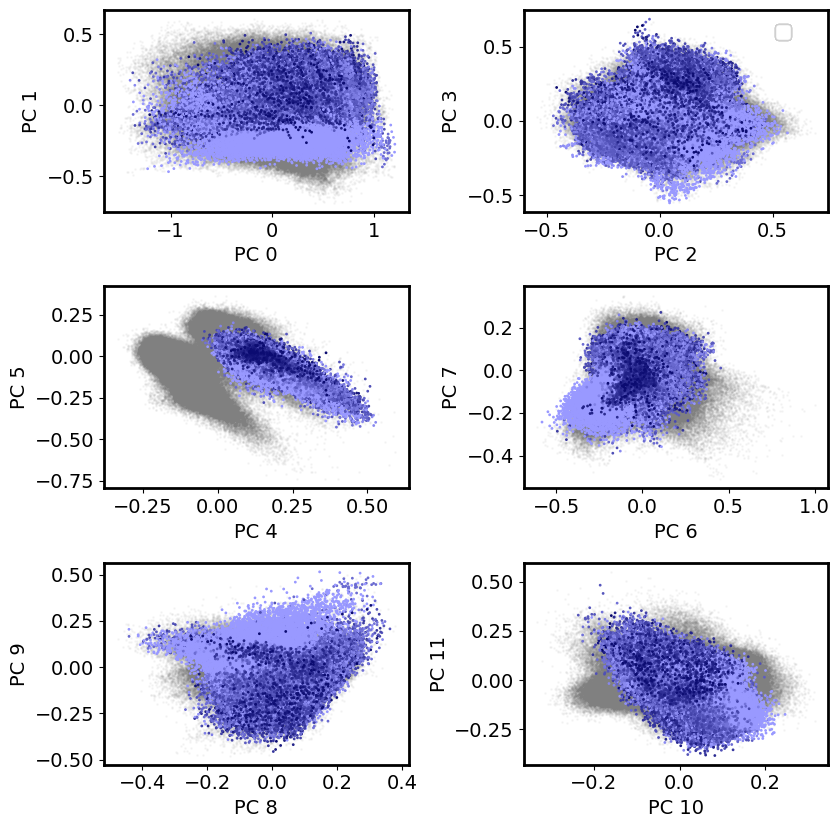

In [225]:
scale = 1.7
fig, axs = plt.subplots(3, 2, figsize=(5 * scale, 5 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

for k in np.arange(0, 12, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    for env_idx in env_indices:
        session_data = all_session_data[env_idx - env_indices[0]]
        all_mask_off = []
        for i in range(1, 2):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                session_data['agent_in_patch'] == 0,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)

            if k == 0:
                print(session_data['rewards_seen_in_patch_type'][:, i][mask_on])

                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    c=session_data['rewards_seen_in_patch_type'][:, i][mask_on],
                    cmap=colors[i],
                    vmin=0,
                    vmax=900,
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    c=session_data['rewards_seen_in_patch_type'][:, i][mask_on],
                    cmap=colors[i],
                    vmin=0,
                    vmax=900,
                )
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()

[0. 0. 0. 0. 0. 0.]
[8. 8. 8. 8. 8. 8. 8. 8. 8. 8. 8. 8.]
[2. 2. 2. 2. 2. 2.]
[0. 0. 0. 0. 0. 0.]
[4. 4. 4. 4. 4. 4.]
[7. 7. 7. 7. 7. 7.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[ 4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  9.  9.  9.  9.  9.  9.
 12. 12. 12. 12. 12. 12. 16. 16. 16. 16. 16. 16. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.]
[ 3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.
  6.  6.  6.  6.  6.  6.  6.  6.  6.  6.  6.  6. 12. 12. 12. 12. 12. 12.]
[ 5.  5.  5.  5.  5.  5.  5.  5.  5.  5.  5.  5. 13. 13. 13. 13. 13. 13.]
[7. 7. 7. 7. 7. 7.]
[7. 7. 7. 7. 7. 7.]
[0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0.]
[8. 8. 8. 8. 8. 8. 8. 8. 8. 8. 8. 8.]
[2. 2. 2. 2. 2. 2.]
[0. 0. 0. 0. 0. 0.]
[4. 4. 4. 4. 4. 4.]
[7. 7. 7. 7. 7. 7.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[ 4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  9.  9.  9.  9.  9.  9.
 12. 12. 12. 12. 12. 12. 16. 16. 16. 1

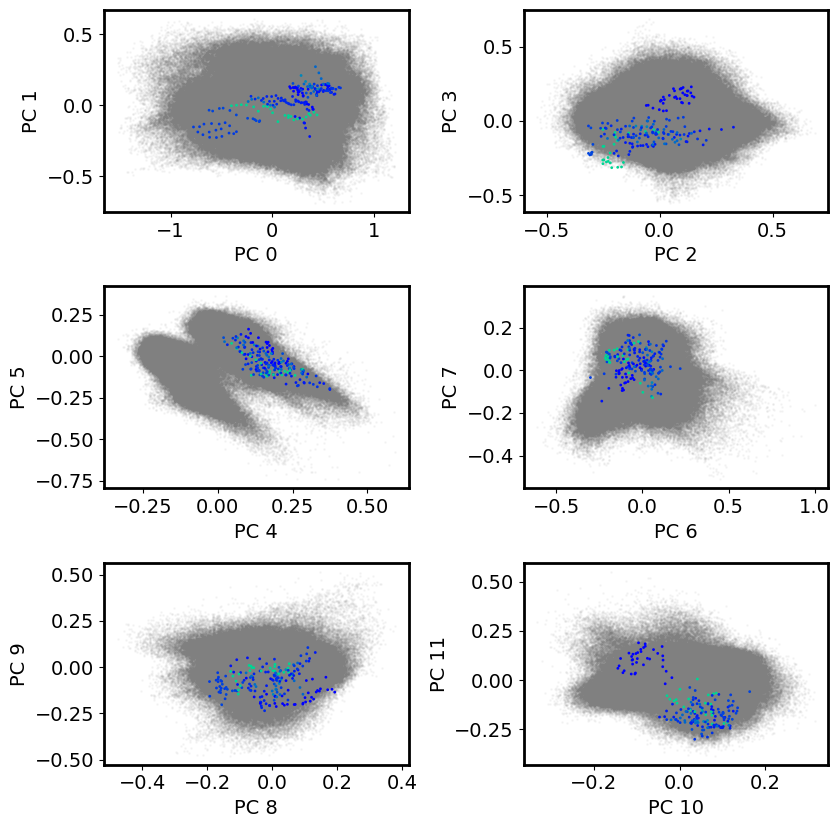

In [75]:
scale = 1.7
fig, axs = plt.subplots(3, 2, figsize=(5 * scale, 5 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

for k in np.arange(0, 12, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    for env_idx in env_indices:
        session_data = all_session_data[env_idx - env_indices[0]]
        all_mask_off = []

        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            np.roll(session_data['total_stops_in_patch_type'][:, 0], 0) > 0,
            np.roll(session_data['total_stops_in_patch_type'][:, 1], 0) == 0,
            np.roll(session_data['total_stops_in_patch_type'][:, 2], 0) == 0,
            session_data['agent_in_patch'] == 0,
        )
        mask_off = ~mask_on
        all_mask_off.append(mask_off)

        if np.sum(mask_on) > 0:
            print(session_data['rewards_seen_in_patch_type'][:, 0][mask_on])
            cbar = axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                c=session_data['rewards_seen_in_patch_type'][:, 0][mask_on],
                cmap='winter',
                vmin=0,
                vmax=30,
            )
        if k == 0 and env_idx == 0:
            plt.colorbar(cbar, ax=axs[k_x, k_y])
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[0, 0].set_title('Activity colored by current patch odor')
    # fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


2 (10, 0, 30)
2 (10, 0, 30)
2 (10, 0, 30)
3 (10, 30, 0)
3 (10, 30, 0)
3 (10, 30, 0)
3 (10, 30, 0)
2 (10, 0, 30)
3 (10, 30, 0)
2 (10, 0, 30)
3 (10, 30, 0)
2 (10, 0, 30)
2 (10, 0, 30)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


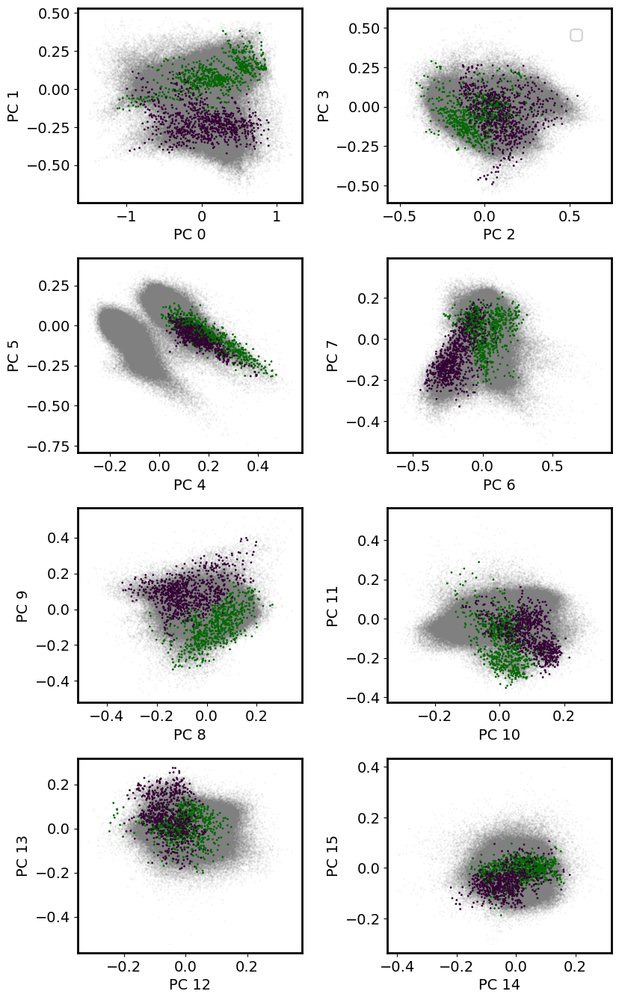

In [47]:
scale = 1.7
fig, axs = plt.subplots(4, 2, figsize=(5 * scale, 8 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap,
    green_colormap,
    orange_colormap,
    brown_colormap
]

all_p = permutations([0, 10, 30])

for k in np.arange(0, 16, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    for env_idx in env_indices:
        session_data = all_session_data[env_idx - env_indices[0]]
        all_mask_off = []
        for i_p, p in enumerate(permutations([0, 10, 30])):
            if np.isclose(p, session_data['reward_params_for_patches']).all():
                break

        if i_p != 2 and i_p != 3:
            continue
            
        mask_on = logical_and(
            session_data['agent_in_patch'] == 0,
            np.arange(len(session_data['agent_in_patch'])) > (len(session_data['agent_in_patch']) - 1000),
        )
        mask_off = ~mask_on
        all_mask_off.append(mask_off)

        if k == 0:
            print(i_p, p)
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                c=np.arange(len(session_data['agent_in_patch']))[mask_on],
                cmap=colors[i_p],
                vmin=0,
            )
        else:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                c=np.arange(len(session_data['agent_in_patch']))[mask_on],
                cmap=colors[i_p],
                vmin=0,
            )
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[0, 0].set_title('Activity colored by current patch odor')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


0 (0, 10, 30)
1 (0, 30, 10)
0 (0, 10, 30)
0 (0, 10, 30)
1 (0, 30, 10)
1 (0, 30, 10)
0 (0, 10, 30)
1 (0, 30, 10)
1 (0, 30, 10)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


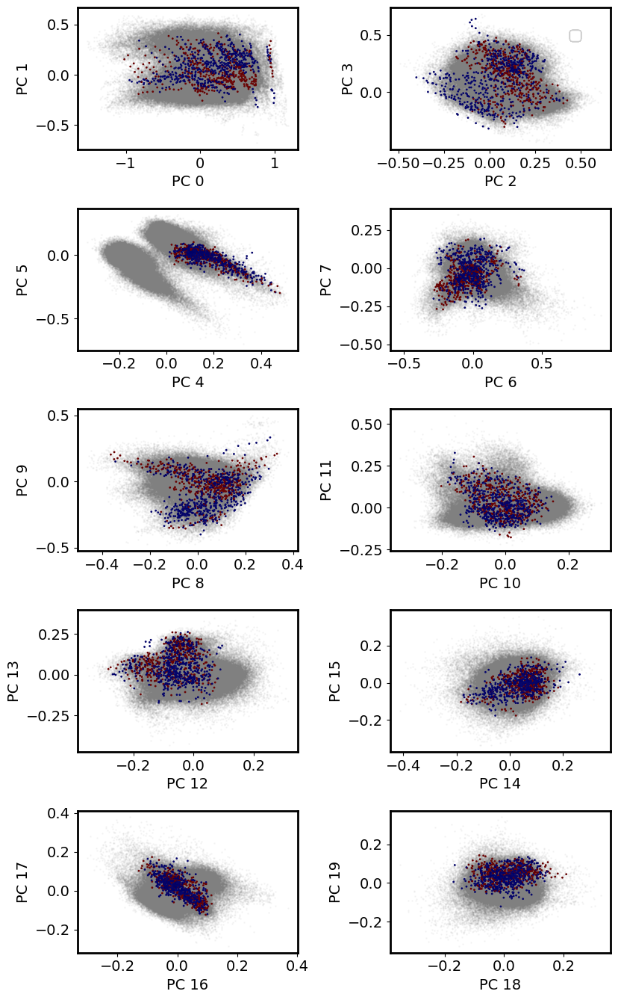

In [229]:
scale = 1.7
fig, axs = plt.subplots(5, 2, figsize=(5 * scale, 8 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap,
    green_colormap,
    orange_colormap,
    brown_colormap
]

all_p = permutations([0, 10, 30])

for k in np.arange(0, 20, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    for env_idx in env_indices:
        session_data = all_session_data[env_idx - env_indices[0]]
        all_mask_off = []
        for i_p, p in enumerate(permutations([0, 10, 30])):
            if np.isclose(p, session_data['reward_params_for_patches']).all():
                break

        if i_p != 0 and i_p != 1:
            continue
            
        mask_on = logical_and(
            session_data['agent_in_patch'] == 0,
            np.arange(len(session_data['agent_in_patch'])) > (len(session_data['agent_in_patch']) - 1000),
        )
        mask_off = ~mask_on
        all_mask_off.append(mask_off)

        if k == 0:
            print(i_p, p)
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                c=np.arange(len(session_data['agent_in_patch']))[mask_on],
                cmap=colors[i_p],
                vmin=0,
            )
        else:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                c=np.arange(len(session_data['agent_in_patch']))[mask_on],
                cmap=colors[i_p],
                vmin=0,
            )
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[0, 0].set_title('Activity colored by current patch odor')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()

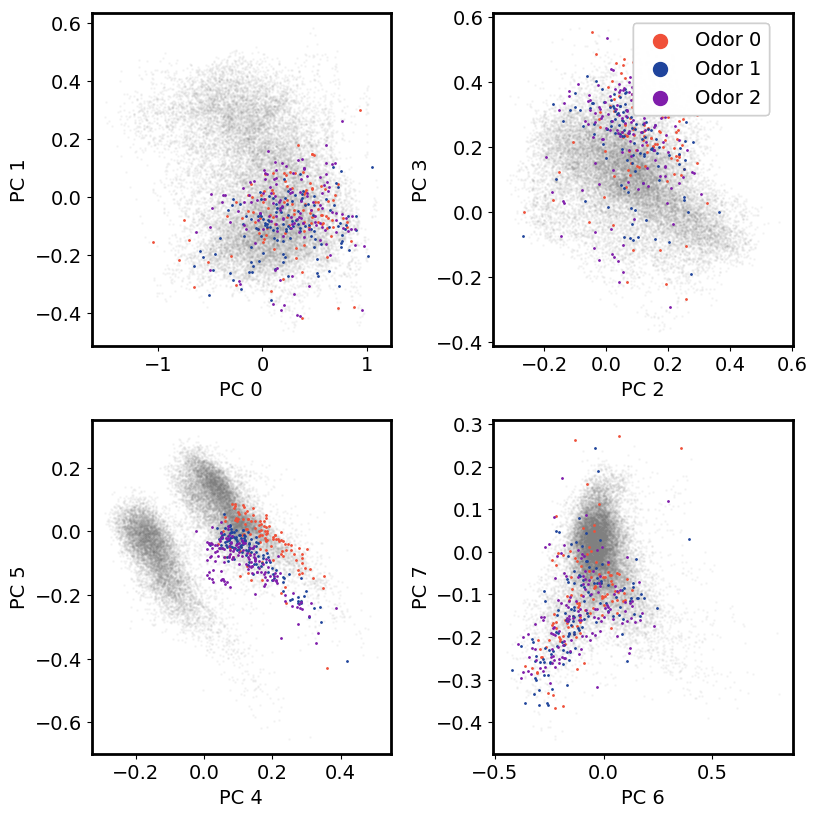

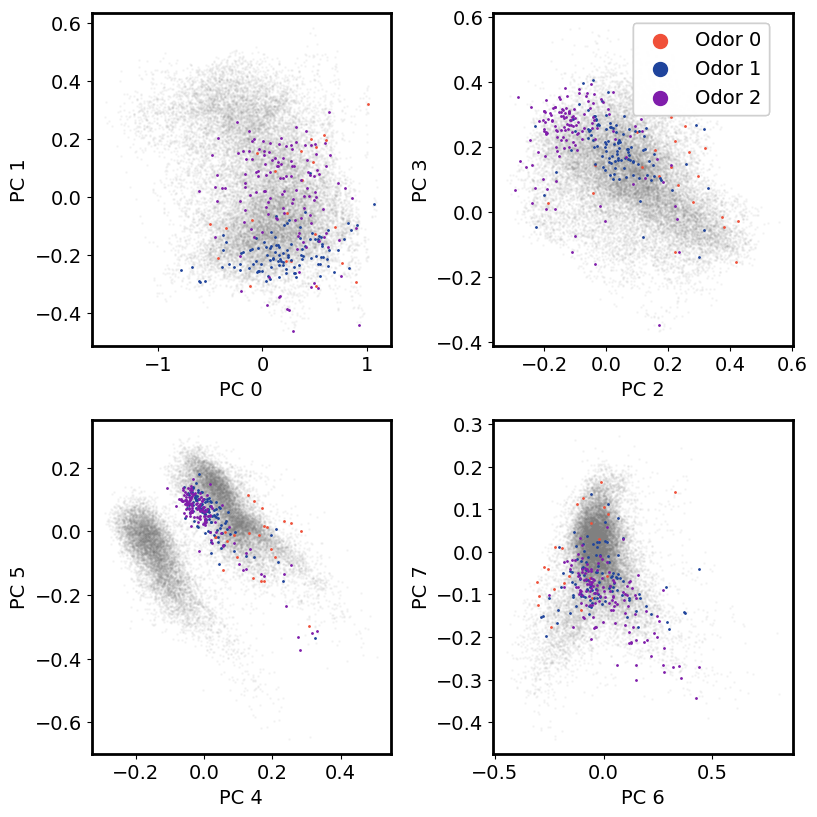

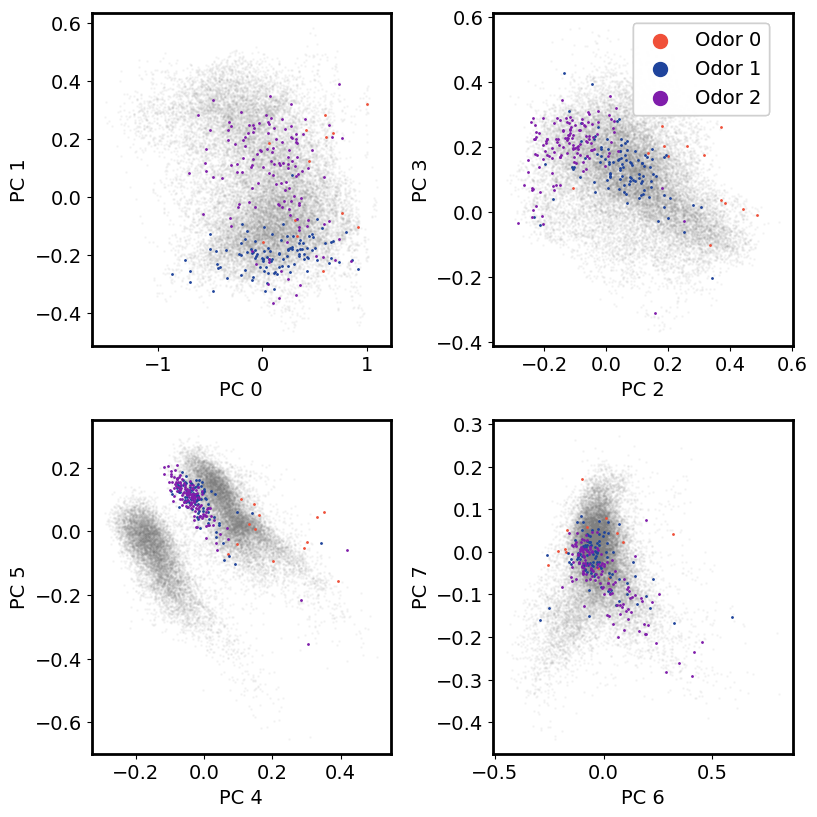

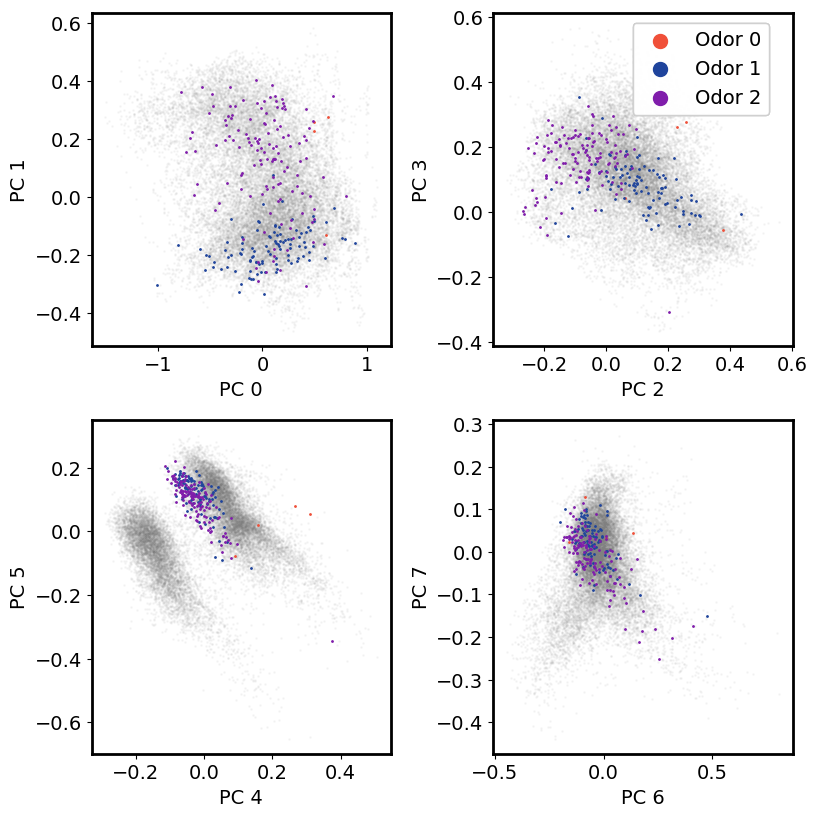

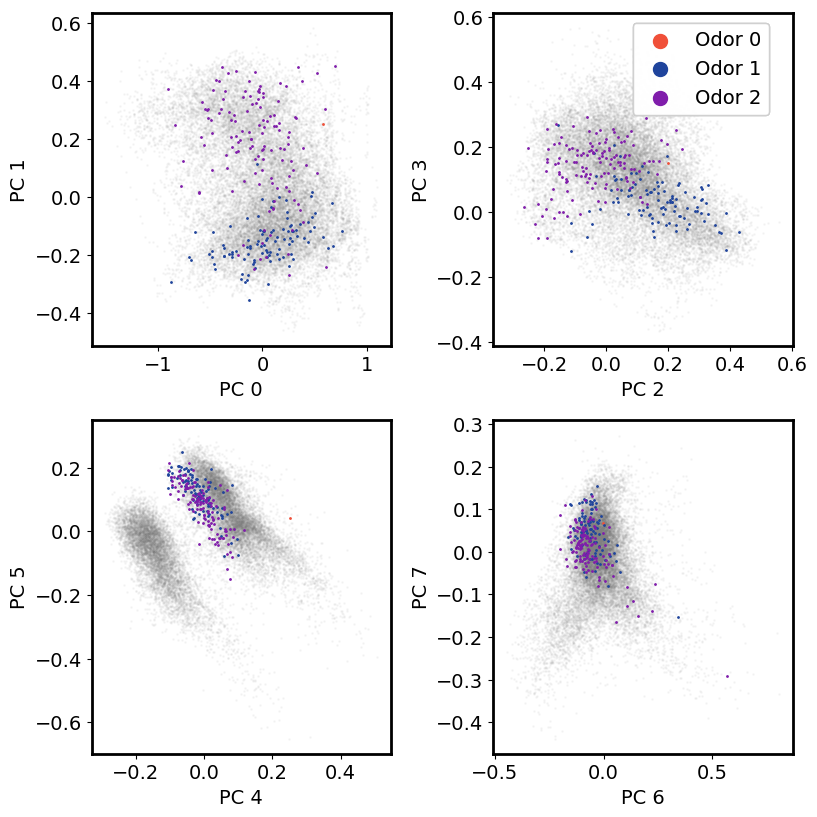

...

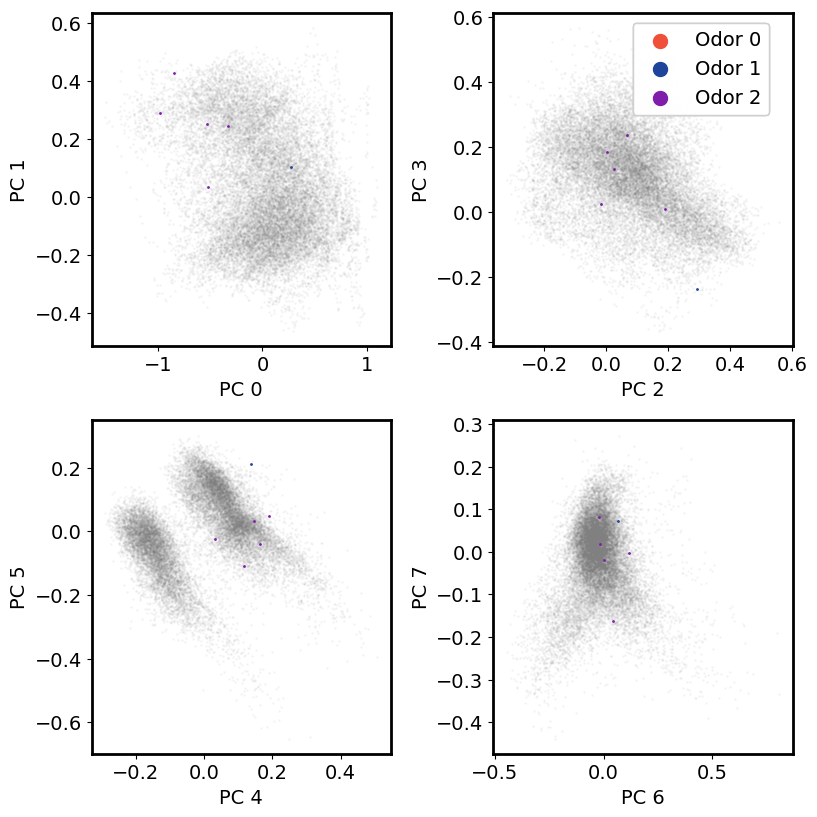

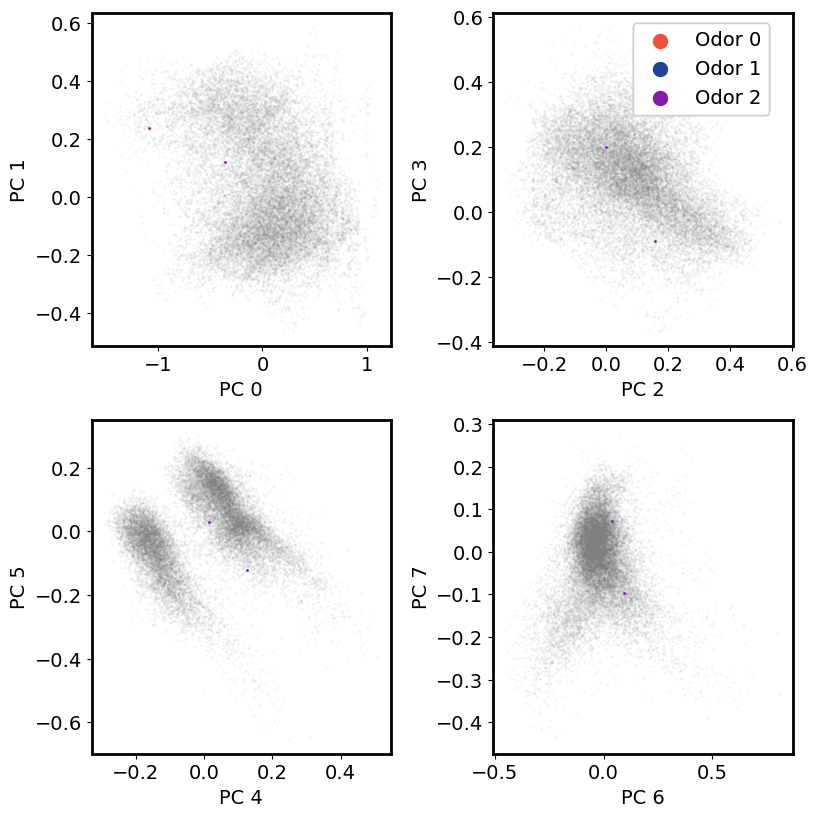

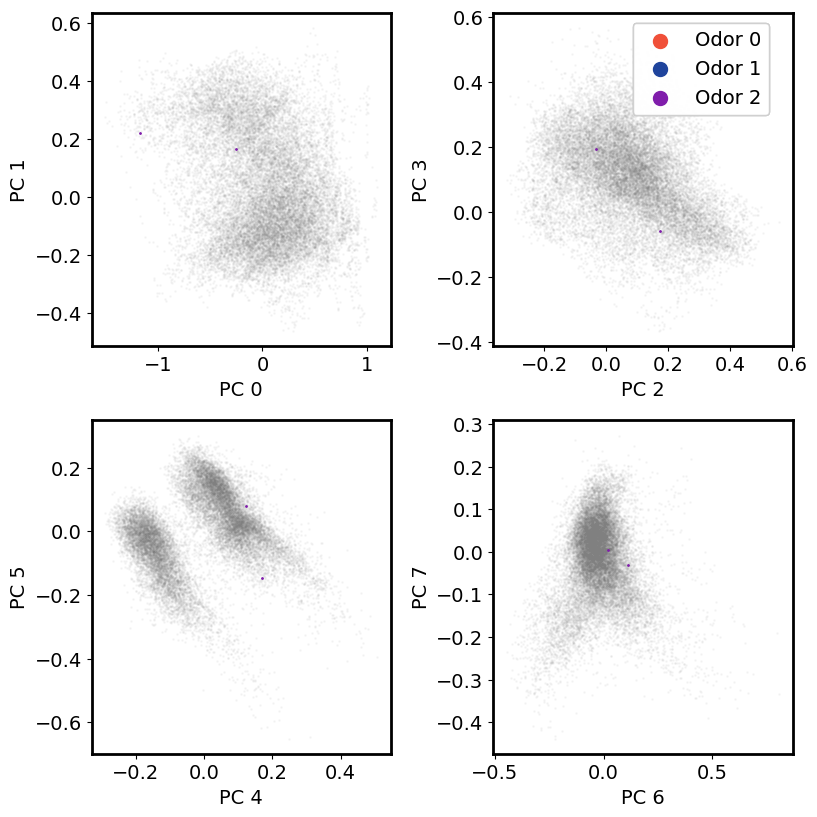

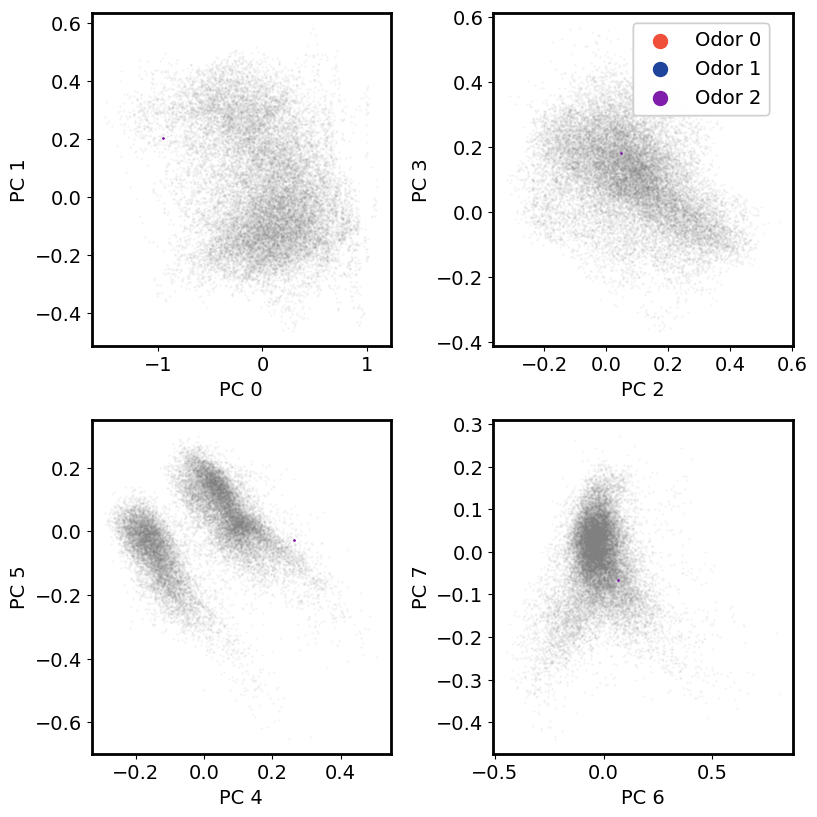

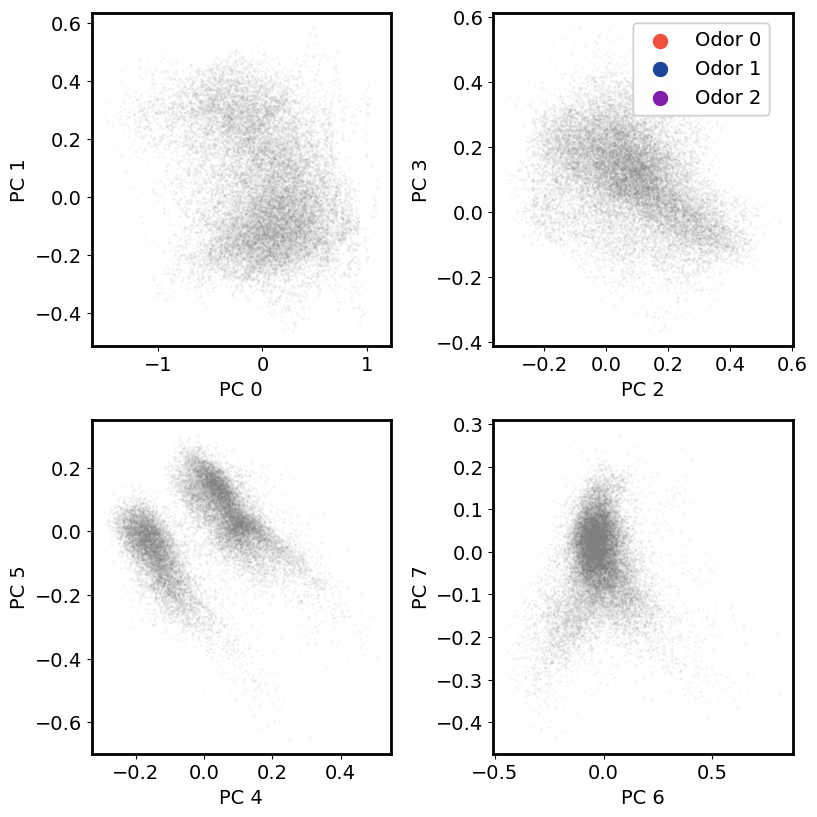

In [17]:
scale = 1.2
colors = ['#F05039', '#1F449C', '#801dab']
n = 0

for reward_site_idx in range(20):
    fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
    for k in np.arange(0, 8, 2):
        k_x, k_y = int(k/4), int(k/2) % 2
        all_mask_off = []
        for i in range(3):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n) == reward_site_idx,
                np.roll(session_data['reward_site_idx'], n + 1) == -1,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                )
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
        axs[k_x, k_y].set_xlabel(f'PC {k}')
        axs[k_x, k_y].set_ylabel(f'PC {k+1}')
        fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
    fig.tight_layout()

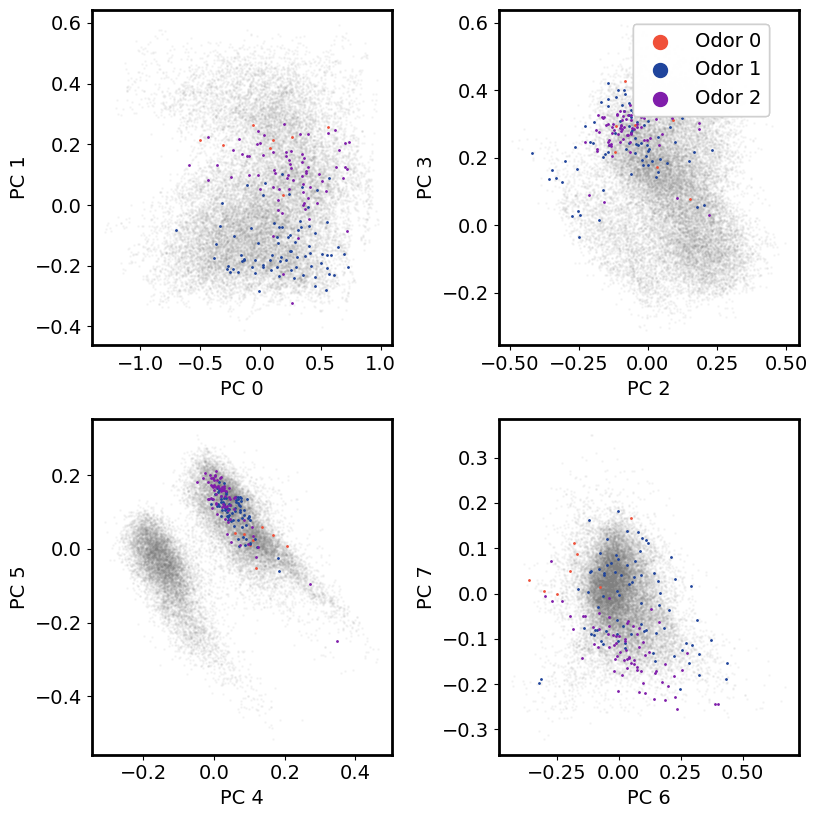

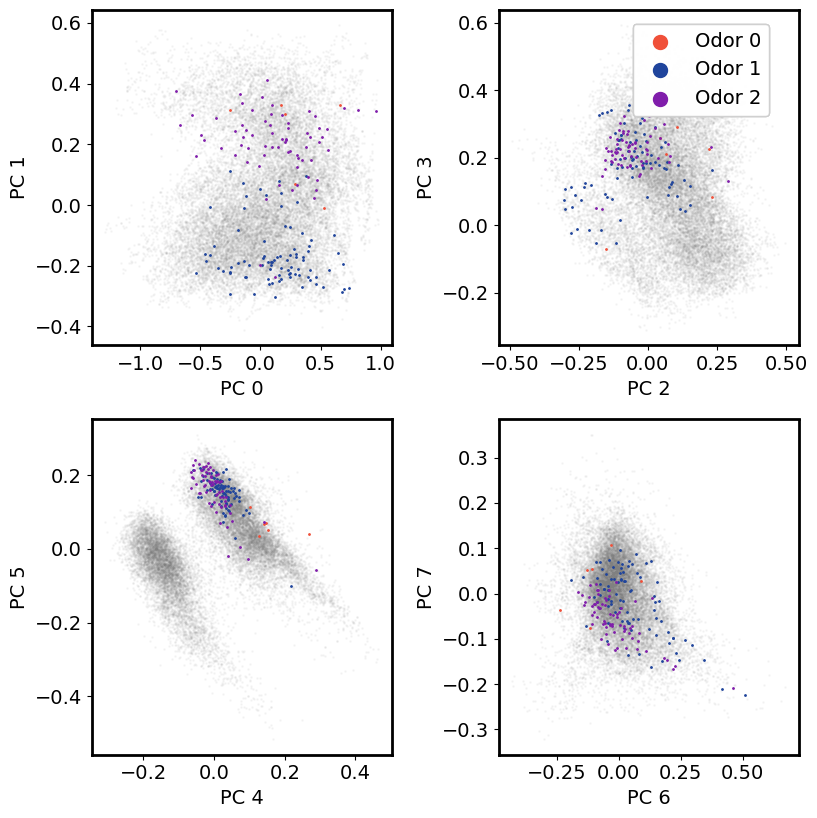

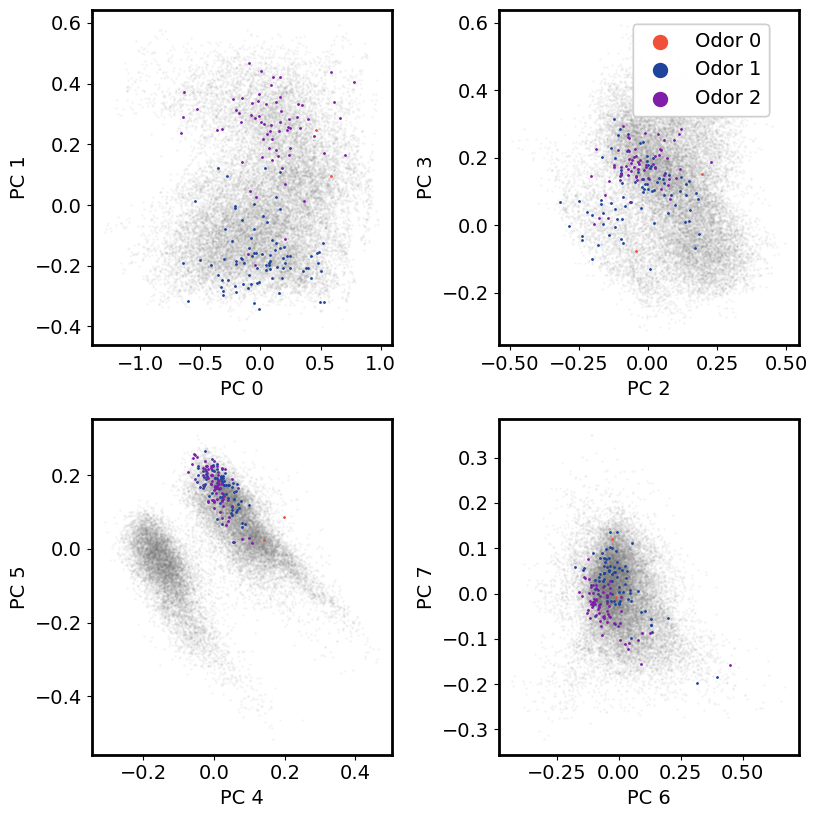

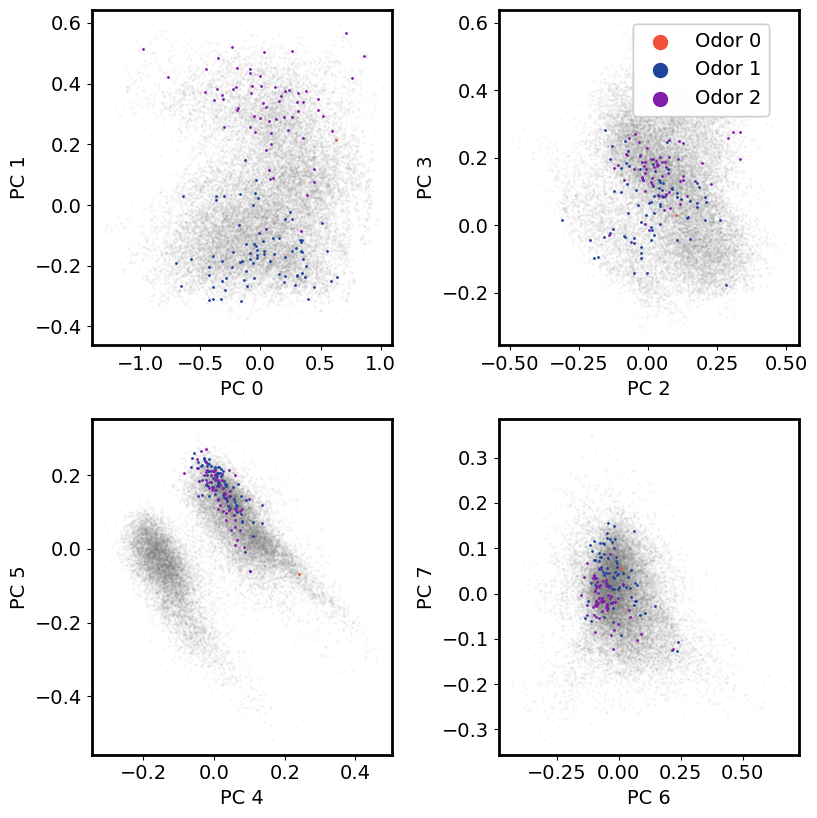

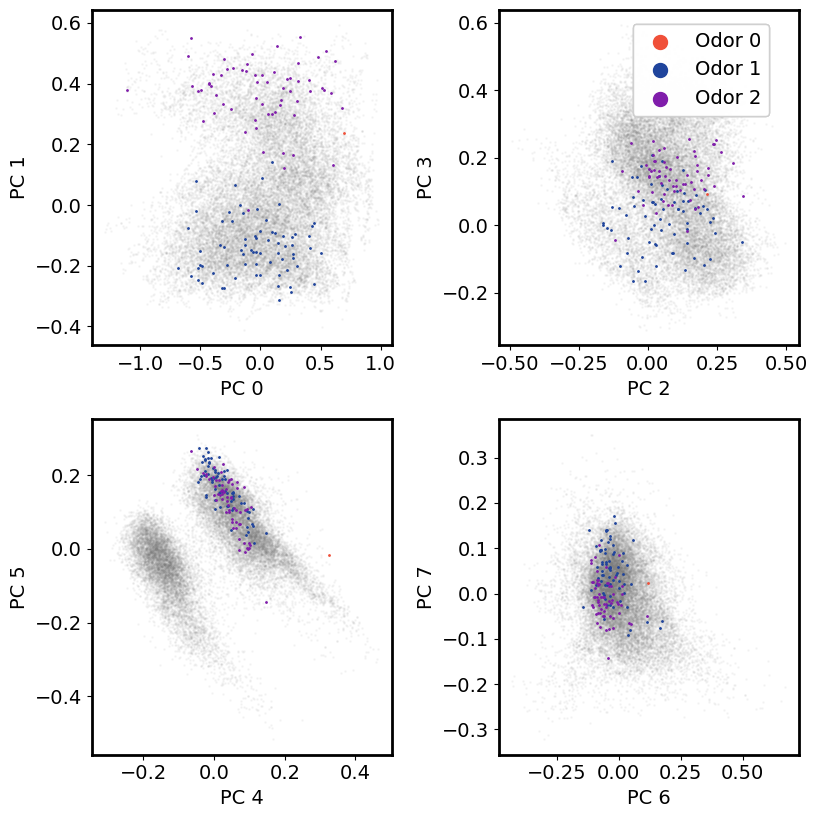

...

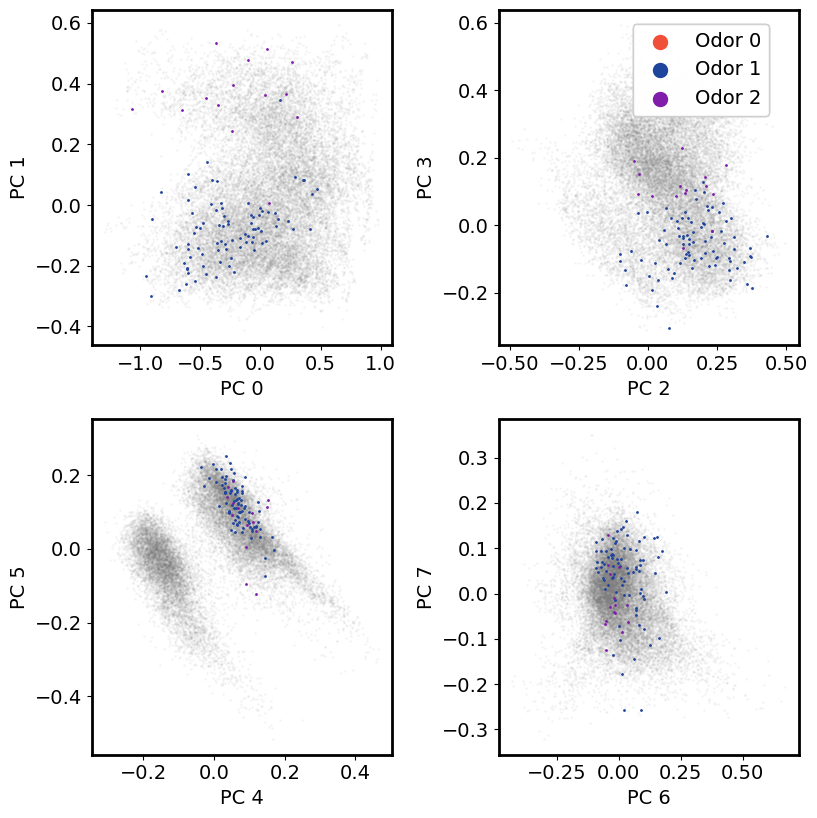

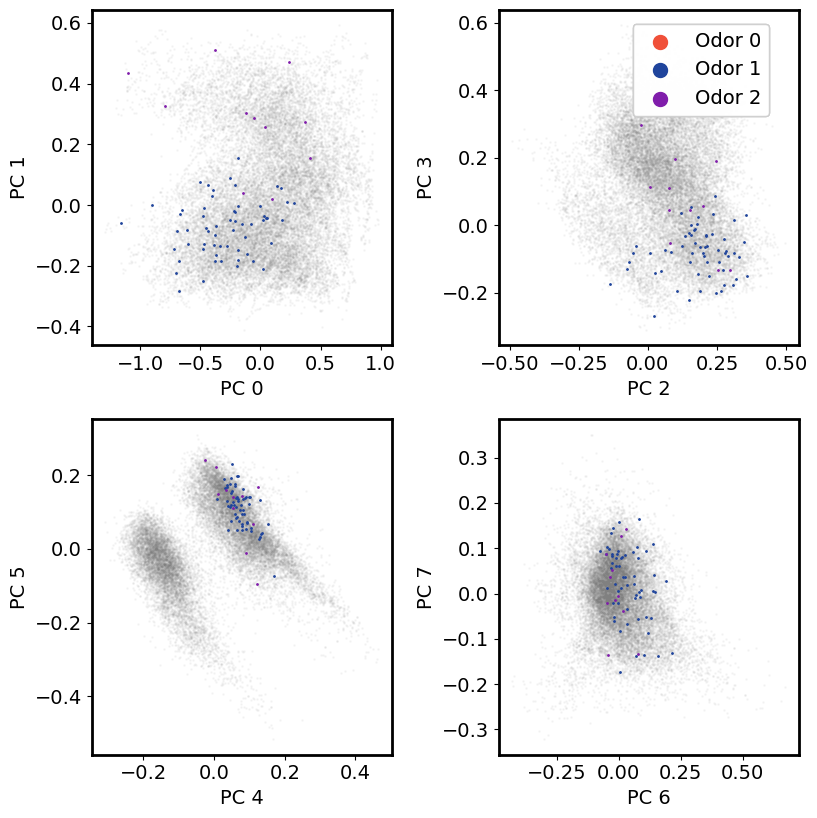

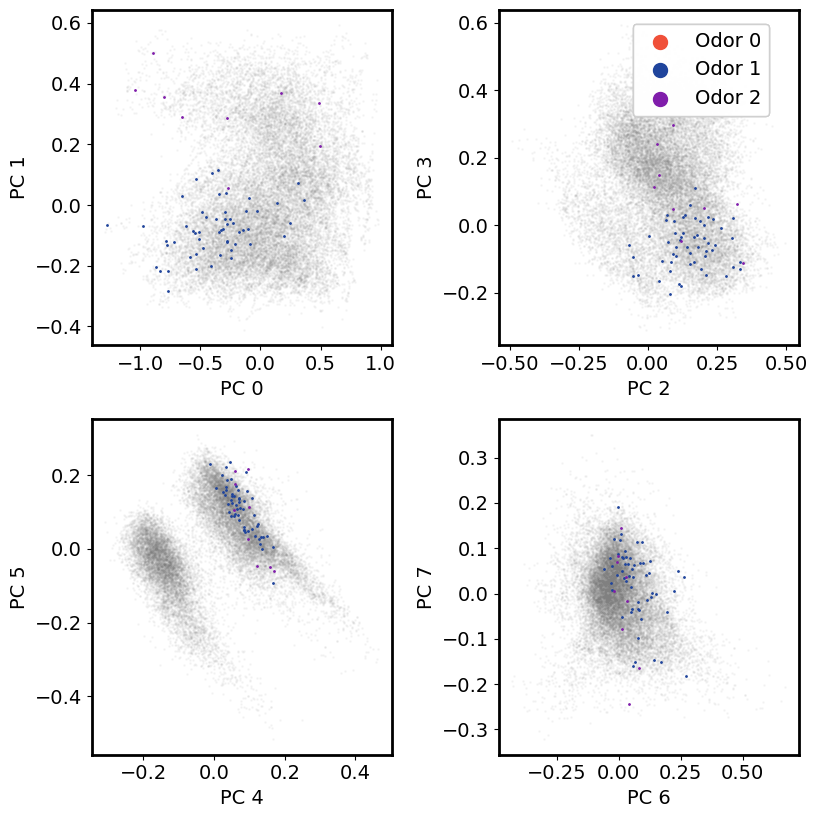

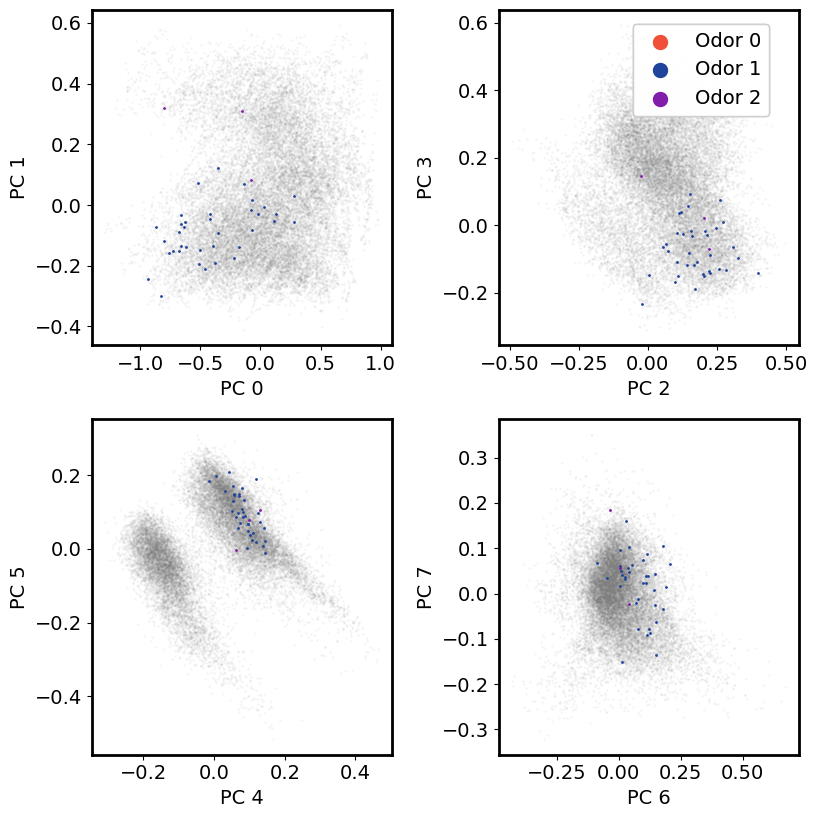

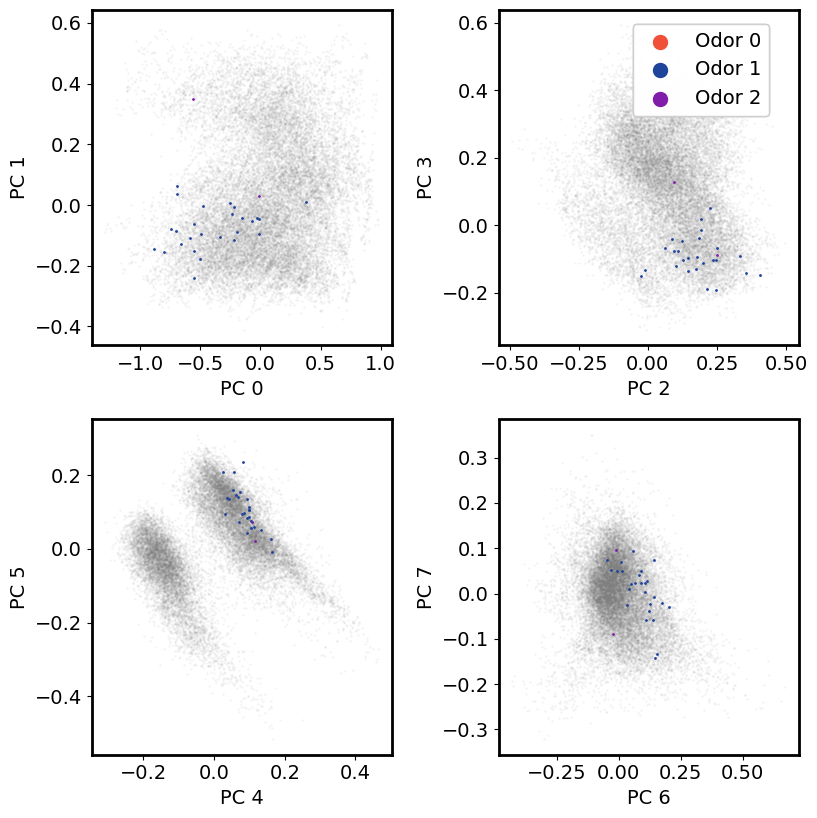

In [44]:
scale = 1.2
colors = ['#F05039', '#1F449C', '#801dab']
n = 1

for reward_site_idx in range(12):
    fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
    for k in np.arange(0, 8, 2):
        k_x, k_y = int(k/4), int(k/2) % 2
        all_mask_off = []
        for i in range(3):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n + 1) == reward_site_idx,
                np.roll(session_data['reward_site_idx'], n) == -1,
                session_data['reward_site_idx'] == -1,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                )
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
        axs[k_x, k_y].set_xlabel(f'PC {k}')
        axs[k_x, k_y].set_ylabel(f'PC {k+1}')
        fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
    fig.tight_layout()

## N steps since agent entered patch

(20000,)
(20000,)
(20000,)
(20000,)


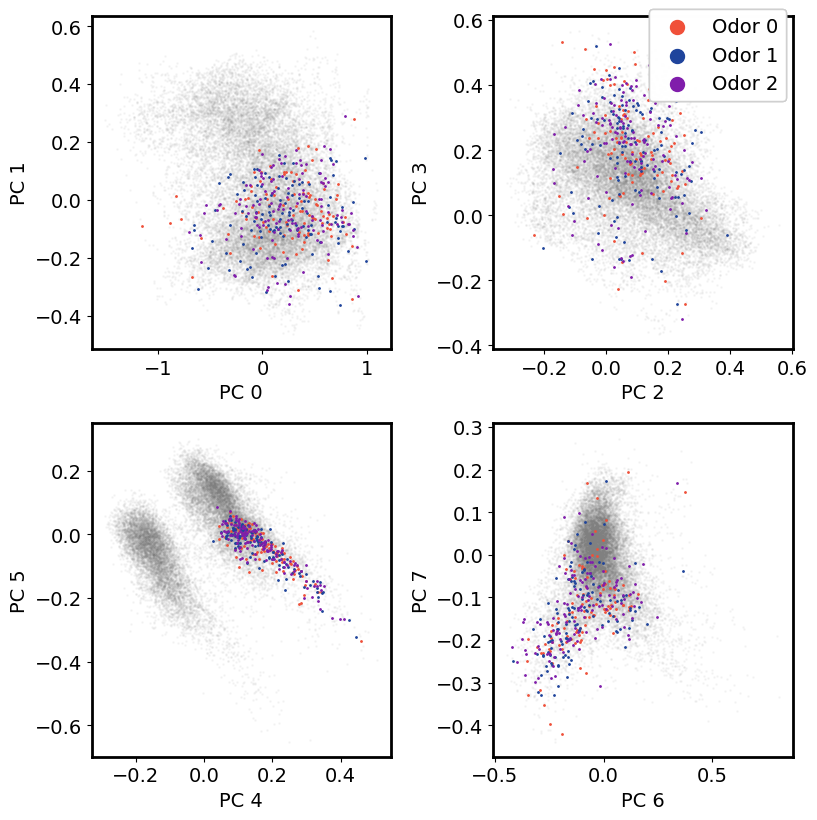

In [18]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = ['#F05039', '#1F449C', '#801dab']

n = 0

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    all_mask_off = []
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            patch_nums == i,
            session_data['agent_in_patch'] > 0,
            np.roll(session_data['agent_in_patch'], n) > 0,
            np.roll(session_data['agent_in_patch'], n + 1) == 0,
        )
        mask_off = ~mask_on
        all_mask_off.append(mask_off)
        
        if k == 0:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
            )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.legend(markerscale=10, bbox_to_anchor=(0.96, 0.99))
fig.tight_layout()

## Agent will leave patch in N steps

(20000,)
(20000,)
(20000,)
(20000,)


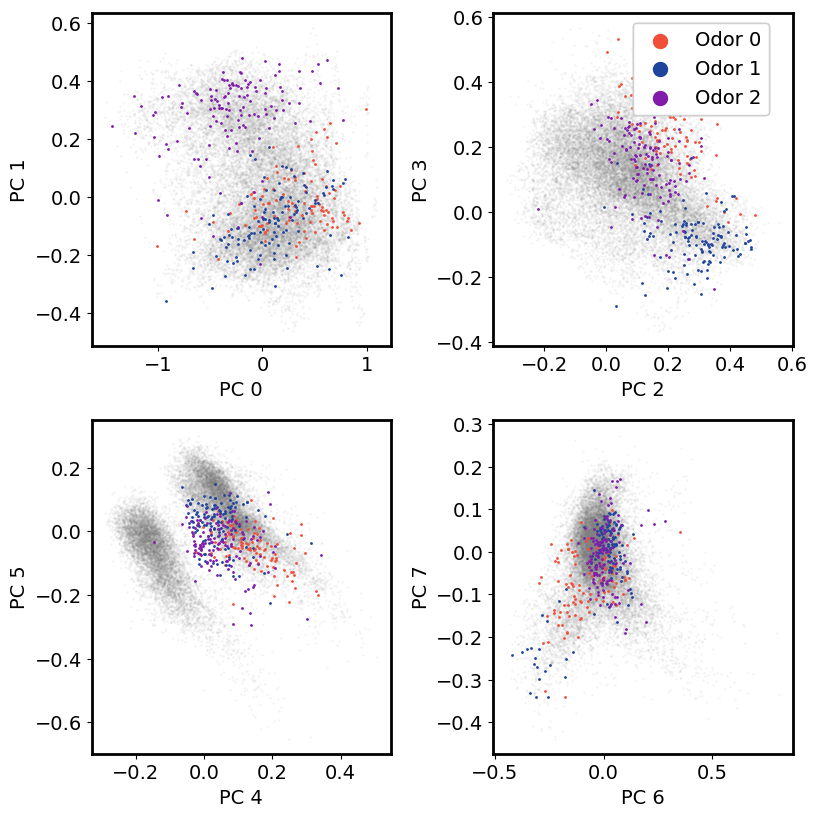

In [19]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = ['#F05039', '#1F449C', '#801dab']

n = 0
reward_site_idx = 0

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    all_mask_off = []
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            patch_nums == i,
            session_data['agent_in_patch'] > 0,
            np.roll(session_data['agent_in_patch'], -1) == 0,
        )
        mask_off = ~mask_on
        all_mask_off.append(mask_off)
        
        if k == 0:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
            )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()

Text(0.5, 1.0, 'Activity colored by dwell time')

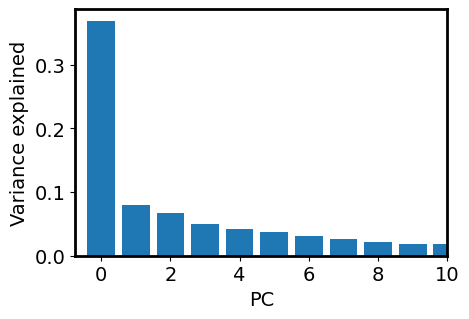

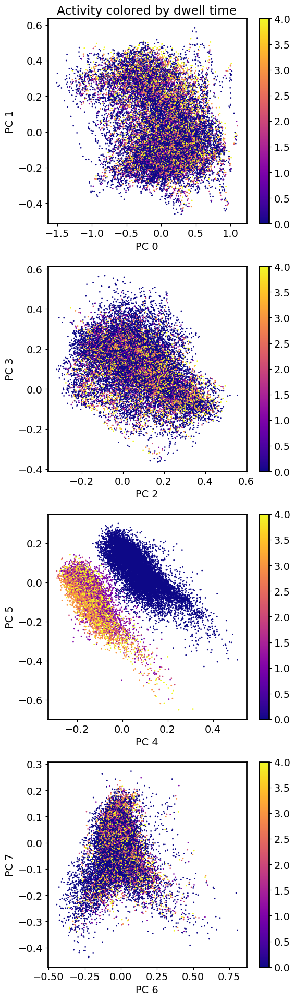

In [20]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[k, env_idx, :],
        pc_activities[k+1, env_idx, :],
        s=1,
        c=session_data['dwell_time'],
        cmap='plasma',
        # vmax=2,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
fig.tight_layout()

axs[0].set_title('Activity colored by dwell time')

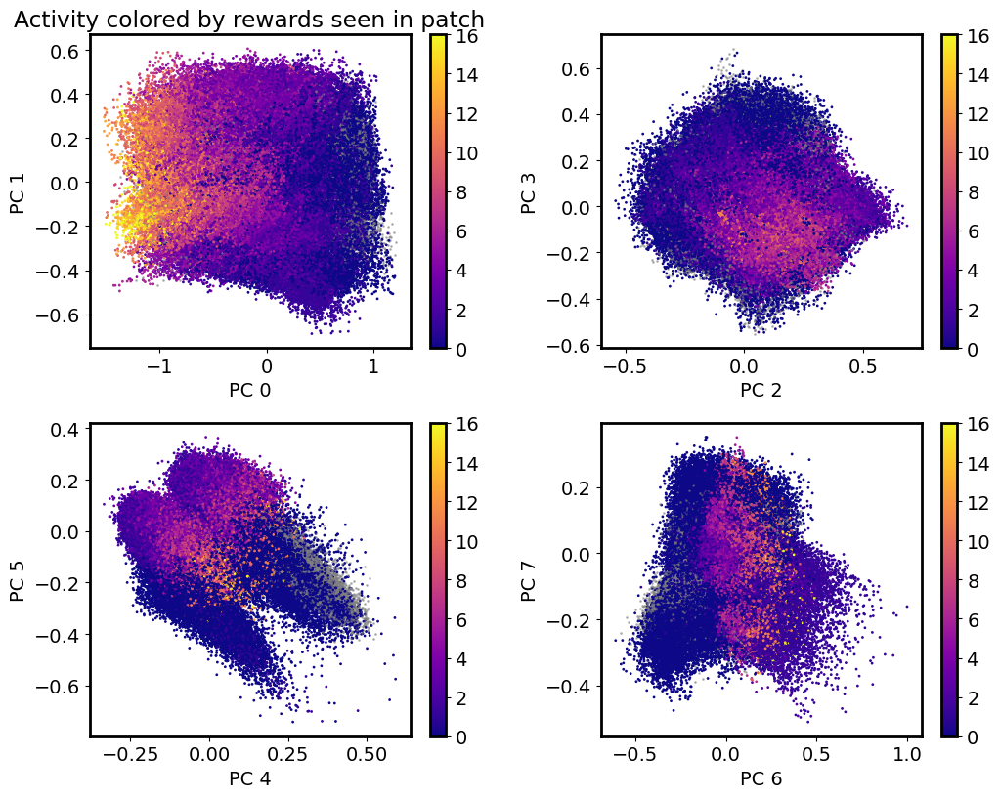

In [231]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    for env_idx in env_indices:
        session_data = all_session_data[env_idx - env_indices[0]]
        cbar = axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
            pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
            s=1,
            c='grey',
            alpha=0.5,
            # vmax=2,
        )
        cbar = axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
            pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
            s=1,
            c=session_data['rewards_seen_in_patch'][session_data['agent_in_patch'] > 0],
            cmap='plasma',
            vmin=0,
        )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0, 0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()